## Customer Segmentation Project using the K-Means Clustering

In [ ]:
%pip seaborn install

In [ ]:
%pip install plotly

In [ ]:
%pip install setuptools

In [ ]:
%pip install python-dev-tools

In [ ]:
%pip install yellowbrick

In [1]:
import numpy as np
import pandas as pd
import sklearn
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib.colors import ListedColormap
import distutils

In [2]:
cmap = colors.ListedColormap(["#682F2F", "#9E726F", "#D6B2B1", "#B9C0C9", "#9F8A78", "#F3AB60"])

# Dictionary of colors for segments and other bins
cluster_colors = {
    0: 'purple', 
    1: 'blue', 
    2: 'orange', 
    3: 'magenta',
    4: 'cyan',
    5: 'red',
    6: 'brown',
    7: 'olive',
    8: 'pink',
    9: 'yellow',
    10: 'lime',
    11: 'teal',
    12: 'navy',
    13: 'gold',
    14: 'coral',
    15: 'violet',
    16: 'indigo',
    17: 'gray',
    18: 'green',
    19: 'turquoise'
}


In [3]:
import os
print(os.path.exists("data_bank_churns/BankChurners.csv"))  # Verifica se o arquivo existe

True


In [4]:
data = pd.read_csv("data_bank_churns/BankChurners.csv")

In [5]:
data.head(10)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998
5,713061558,Existing Customer,44,M,2,Graduate,Married,$40K - $60K,Blue,36,...,4010.0,1247,2763.0,1.376,1088,24,0.846,0.311,0.000055,0.99994
6,810347208,Existing Customer,51,M,4,Unknown,Married,$120K +,Gold,46,...,34516.0,2264,32252.0,1.975,1330,31,0.722,0.066,0.000123,0.99988
7,818906208,Existing Customer,32,M,0,High School,Unknown,$60K - $80K,Silver,27,...,29081.0,1396,27685.0,2.204,1538,36,0.714,0.048,0.000086,0.99991
8,710930508,Existing Customer,37,M,3,Uneducated,Single,$60K - $80K,Blue,36,...,22352.0,2517,19835.0,3.355,1350,24,1.182,0.113,0.000045,0.99996
9,719661558,Existing Customer,48,M,2,Graduate,Single,$80K - $120K,Blue,36,...,11656.0,1677,9979.0,1.524,1441,32,0.882,0.144,0.000303,0.99970


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 23 columns):
 #   Column                                                                                                                              Non-Null Count  Dtype  
---  ------                                                                                                                              --------------  -----  
 0   CLIENTNUM                                                                                                                           10127 non-null  int64  
 1   Attrition_Flag                                                                                                                      10127 non-null  object 
 2   Customer_Age                                                                                                                        10127 non-null  int64  
 3   Gender                                                                           

In [7]:
data.drop(
    ["Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1",
     "Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2"
     ],
    axis=1, # Removing collums
    inplace=True #Removing directly from the original dataset
    )

In [8]:
# Create a DataFrame to describe the meaning of each column
data_dictionary = pd.DataFrame({
    "Column name": [
        "CLIENTNUM", "Attrition_Flag", "Customer_Age", "Gender", "Dependent_count", 
        "Education_Level", "Marital_Status", "Income_Category", "Card_Category", 
        "Months_on_book", "Total_Relationship_Count", "Months_Inactive_12_mon", 
        "Contacts_Count_12_mon", "Credit_Limit", "Total_Revolving_Bal", 
        "Avg_Open_To_Buy", "Total_Amt_Chng_Q4_Q1", "Total_Trans_Amt", 
        "Total_Trans_Ct", "Total_Ct_Chng_Q4_Q1", "Avg_Utilization_Ratio"
    ],
    "Description": [
        "Unique identifier for each customer",
        "Indicates if the customer is active or has churned (Attrited/Existing)",
        "Age of the customer",
        "Gender of the customer (M/F)",
        "Number of dependents the customer has",
        "Education level of the customer",
        "Marital status of the customer",
        "Income category of the customer",
        "Type of card held by the customer (e.g., Blue, Silver, Gold, Platinum)",
        "Number of months the customer has been with the bank",
        "Total number of products/services the customer uses with the bank",
        "Number of months the customer was inactive in the last 12 months",
        "Number of contacts the customer had with the bank in the last 12 months",
        "Credit limit assigned to the customer",
        "Total revolving balance (unpaid balance on the credit card)",
        "Credit available after subtracting the revolving balance from the credit limit",
        "Change in total amount spent by the customer from Q4 to Q1",
        "Total transaction amount in dollars",
        "Total number of transactions made by the customer",
        "Change in transaction count from Q4 to Q1",
        "Average utilization ratio (balance-to-limit ratio)"
    ]
})
#Show the entire content of the columns:
pd.set_option('display.max_colwidth', None)

# Display the data dictionary
print("\nData Dictionary:")
data_dictionary



Data Dictionary:


,Column name,Description
0,CLIENTNUM,Unique identifier for each customer
1,Attrition_Flag,Indicates if the customer is active or has churned (Attrited/Existing)
2,Customer_Age,Age of the customer
3,Gender,Gender of the customer (M/F)
4,Dependent_count,Number of dependents the customer has
5,Education_Level,Education level of the customer
6,Marital_Status,Marital status of the customer
7,Income_Category,Income category of the customer
8,Card_Category,"Type of card held by the customer (e.g., Blue, Silver, Gold, Platinum)"
9,Months_on_book,Number of months the customer has been with the bank


### EDA

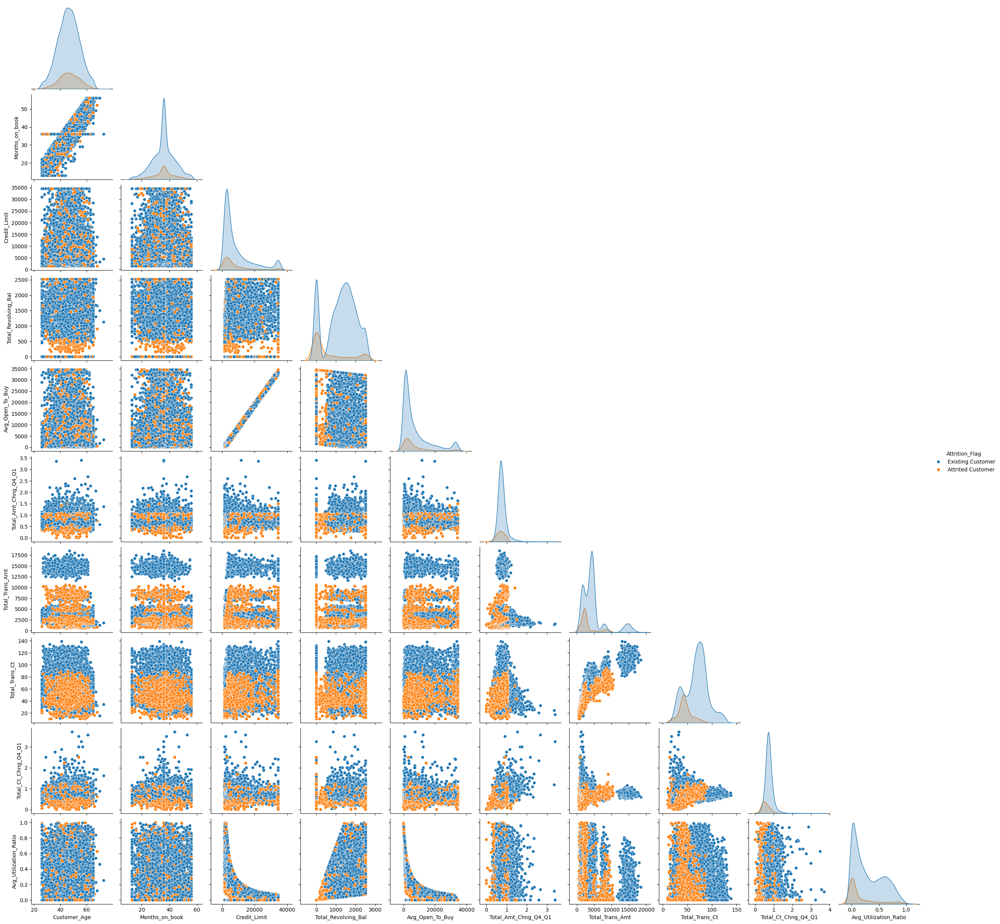

In [9]:
features_to_plot = ["Customer_Age", "Dependent_count", "Months_on_book", "Total_Relationship_Count", 
                   "Months_Inactive_12_mon", "Contacts_Count_12_mon", "Credit_Limit", "Total_Revolving_Bal", "Avg_Open_To_Buy", 
                   "Total_Amt_Chng_Q4_Q1", "Total_Trans_Amt", "Total_Trans_Ct", "Total_Ct_Chng_Q4_Q1", "Avg_Utilization_Ratio"]

features_to_plot_2 = ["Attrition_Flag", "Customer_Age", "Gender", "Months_on_book", "Credit_Limit", "Total_Revolving_Bal", "Avg_Open_To_Buy", 
                   "Total_Amt_Chng_Q4_Q1", "Total_Trans_Amt", "Total_Trans_Ct", "Total_Ct_Chng_Q4_Q1", "Avg_Utilization_Ratio"]

sns.pairplot(data[features_to_plot_2], hue="Attrition_Flag", corner=True)
plt.show()

#### Pearson correlation measures the strength and direction of a linear relationship between two variables. It ranges from -1 to 1:

- 1 indicates a perfect positive relationship (both variables increase together).
- -1 indicates a perfect negative relationship (one variable increases as the other decreases).
- 0 indicates no linear relationship.

$$
r = \frac{\sum (X_i - \bar{X})(Y_i - \bar{Y})}{\sqrt{\sum (X_i - \bar{X})^2 \sum (Y_i - \bar{Y})^2}}
$$


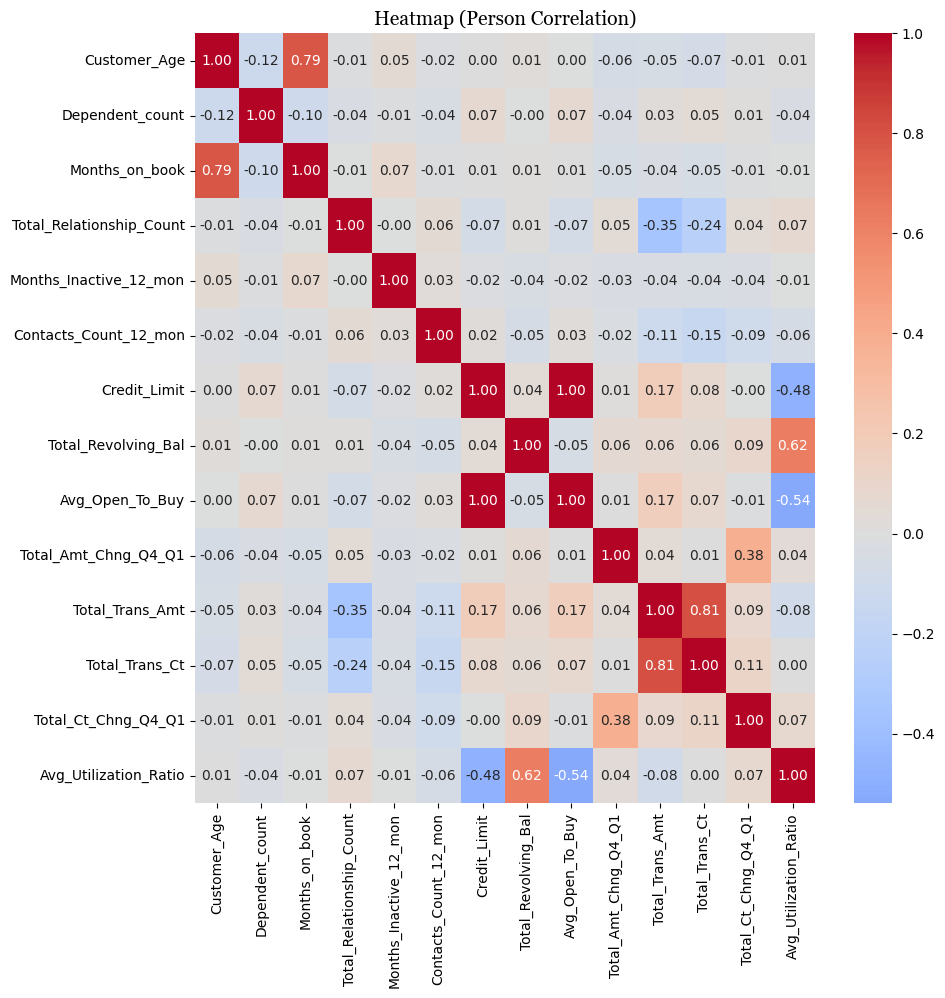

In [10]:
plt.figure(figsize=(10,10))
sns.heatmap(data[features_to_plot].corr(), cmap='coolwarm', annot=True, fmt='.2f', center=0, cbar=True) # Calculates Pearson correlation by default
plt.title("Heatmap (Person Correlation)", fontname='Georgia', fontsize=14)
plt.show()

## Data Preprocessing

In [11]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

In [12]:
#Get the list of categorical features
s = (data.dtypes == 'object')
object_cols = list(s[s].index)

print("Categorical features in the dataset:", object_cols)

Categorical features in the dataset: ['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']


In [13]:
data[object_cols]

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
0,Existing Customer,M,High School,Married,$60K - $80K,Blue
1,Existing Customer,F,Graduate,Single,Less than $40K,Blue
2,Existing Customer,M,Graduate,Married,$80K - $120K,Blue
3,Existing Customer,F,High School,Unknown,Less than $40K,Blue
4,Existing Customer,M,Uneducated,Married,$60K - $80K,Blue
...,...,...,...,...,...,...
10122,Existing Customer,M,Graduate,Single,$40K - $60K,Blue
10123,Attrited Customer,M,Unknown,Divorced,$40K - $60K,Blue
10124,Attrited Customer,F,High School,Married,Less than $40K,Blue
10125,Attrited Customer,M,Graduate,Unknown,$40K - $60K,Blue


In [14]:
# Para cada variável categórica, verifique a contagem de valores
print(data['Gender'].value_counts())  # Exemplo para uma variável categórica
print(data['Gender'].value_counts(normalize=True))  # Relative Freq
print(data['Marital_Status'].value_counts())  # Exemplo para outra variável categórica
print(data['Card_Category'].value_counts())  # Exemplo para outra variável categórica

Gender
F    5358
M    4769
Name: count, dtype: int64
Gender
F    0.529081
M    0.470919
Name: proportion, dtype: float64
Marital_Status
Married     4687
Single      3943
Unknown      749
Divorced     748
Name: count, dtype: int64
Card_Category
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: count, dtype: int64


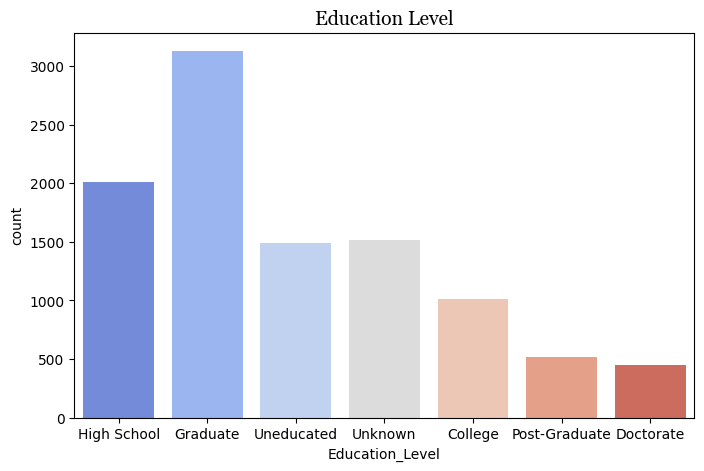

In [15]:
plt.figure(figsize=(8,5))
sns.countplot(data=data, x="Education_Level", hue="Education_Level", palette='coolwarm')
plt.title("Education Level", fontname='Georgia', fontsize=14)
plt.show()

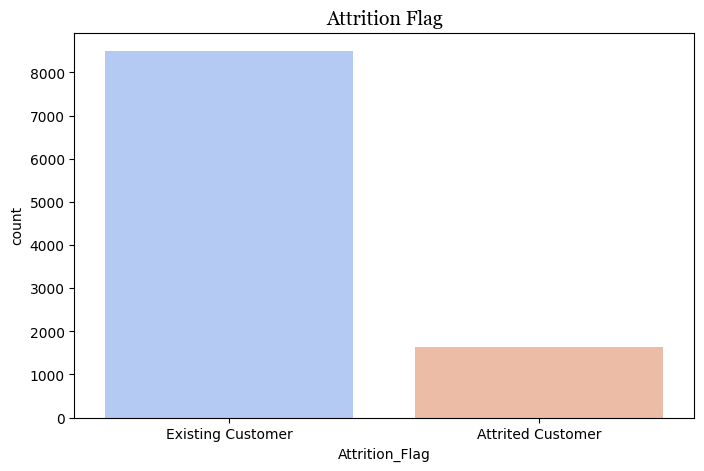

In [16]:
plt.figure(figsize=(8,5))
sns.countplot(data=data, x="Attrition_Flag", hue="Attrition_Flag", palette='coolwarm')
plt.title("Attrition Flag", fontname='Georgia', fontsize=14)
plt.show()

In [17]:
data["Income_Category"].value_counts()

Income_Category
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: count, dtype: int64

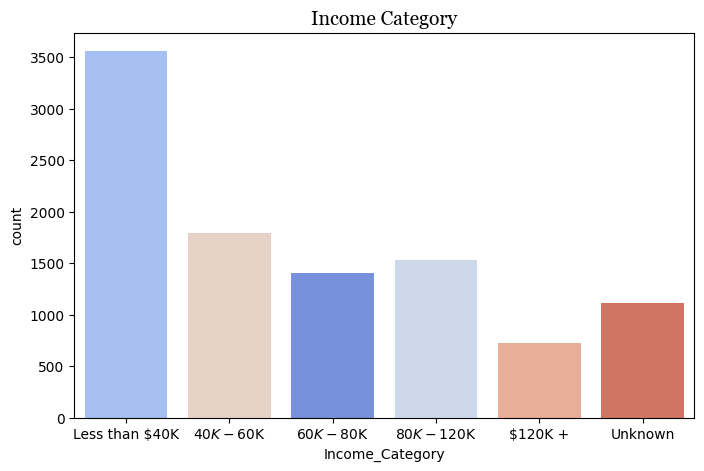

In [18]:
plt.figure(figsize=(8,5))
order = ["Less than $40K", "$40K - $60K", "$60K - $80K", "$80K - $120K", "$120K +", "Unknown"]
sns.countplot(data=data, x="Income_Category", hue="Income_Category", order=order, palette='coolwarm')
plt.title("Income Category", fontname='Georgia', fontsize=14)
plt.show()

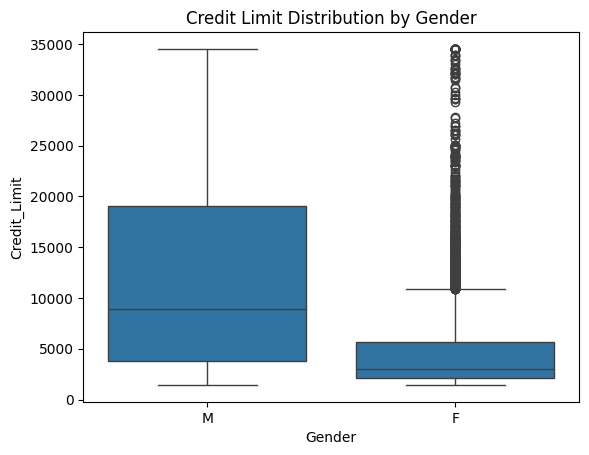

In [19]:
sns.boxplot(data=data, x='Gender', y='Credit_Limit')
plt.title('Credit Limit Distribution by Gender')
plt.show()

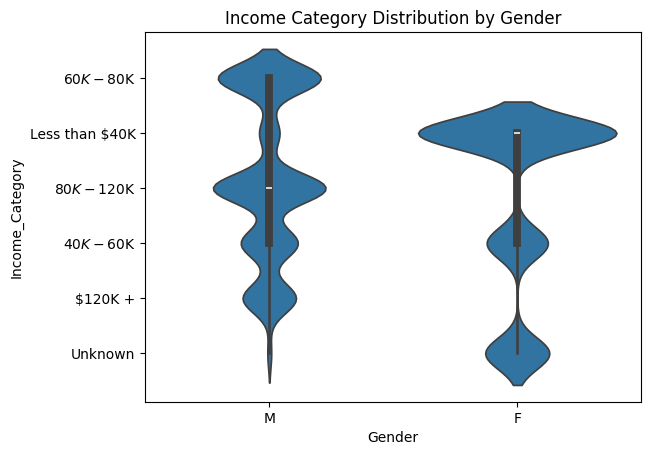

In [20]:
sns.violinplot(data=data, x='Gender', y='Income_Category')
plt.title('Income Category Distribution by Gender')
plt.show()

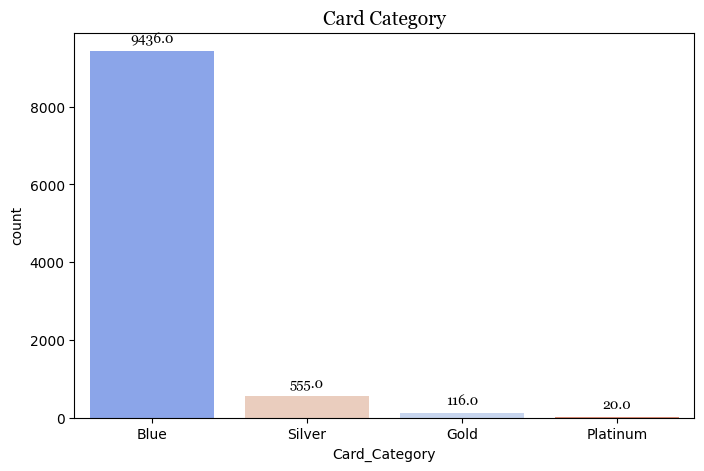

In [21]:
plt.figure(figsize=(8,5))
order = ["Blue", "Silver", "Gold", "Platinum"]
ax = sns.countplot(data=data, x="Card_Category", hue="Card_Category", order=order, palette='coolwarm')

for p in ax.patches:
    # Get the height of each bar
    height = p.get_height()
    # Add the count as a label on top of the bar
    ax.annotate(f'{height}', 
                (p.get_x() + p.get_width() / 2., height), 
                ha='center', va='center', 
                fontsize=10, color='black',
                fontname='Georgia', 
                xytext=(0, 9), textcoords='offset points')
    
plt.title("Card Category", fontname='Georgia', fontsize=14)
plt.show()

In [22]:
# Tabela de contingência entre 'Gender' e 'Marital_Status'
pd.crosstab(data['Gender'], data['Marital_Status'], margins=True)

Marital_Status,Divorced,Married,Single,Unknown,All
Gender,,,,,
F,402,2451,2125,380,5358
M,346,2236,1818,369,4769
All,748,4687,3943,749,10127


### Chi-Square Test 

The **chi-square test** is calculated using the formula:

$$
\chi^2 = \sum \frac{(O_i - E_i)^2}{E_i}
$$

Where:
- \(O_i\) is the observed frequency.
- \(E_i\) is the expected frequency.
- The summation is performed across all categories of the variables under analysis.

In [23]:
from scipy.stats import chi2_contingency

# Tabela de contingência entre 'Gender' e 'Income_Category'
contingency_table = pd.crosstab(data['Gender'], data['Income_Category'])

# Teste de Qui-Quadrado
chi2, p, dof, expected = chi2_contingency(contingency_table)

# Results:
print(f"Chi2 Value: {chi2}")
print(f"P-Value: {p}")
print(f"Degrees of Freedom: {dof}")
#print(f"Expected Frequencies: \n{expected}")

Chi2 Value: 7138.449964928253
P-Value: 0.0
Degrees of Freedom: 5


In [24]:
from scipy.stats import chi2_contingency

# Tabela de contingência entre 'Education_Level' e 'Card_Category'
contingency_table = pd.crosstab(data['Education_Level'], data['Card_Category'])

# Teste de Qui-Quadrado
chi2, p, dof, expected = chi2_contingency(contingency_table)

# Results:
print(f"Chi2 Value: {chi2}")
print(f"P-Value: {p}")
print(f"Degrees of Freedom: {dof}")
#print(f"Expected Frequencies: \n{expected}")

Chi2 Value: 17.628878825370787
P-Value: 0.48034082554808755
Degrees of Freedom: 18


### Transforming Categorical Features

In [25]:
print("Categorical features in the dataset:", object_cols)

Categorical features in the dataset: ['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']


In [26]:
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [27]:
one_hot_encoder = OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False)

encoded = one_hot_encoder.fit_transform(data[object_cols])

encoded_columns = one_hot_encoder.get_feature_names_out(object_cols)

enconded_df = pd.DataFrame(encoded, columns = encoded_columns, index=data.index)

data_final = pd.concat([data.drop(object_cols, axis=1), enconded_df], axis=1)

data_final.head()

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,...,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,768805383,45,3,39,5,1,3,12691.0,777,11914.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,818770008,49,5,44,6,1,2,8256.0,864,7392.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,713982108,51,3,36,4,1,0,3418.0,0,3418.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,769911858,40,4,34,3,4,1,3313.0,2517,796.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,709106358,40,3,21,5,1,0,4716.0,0,4716.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [28]:
data_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 34 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CLIENTNUM                         10127 non-null  int64  
 1   Customer_Age                      10127 non-null  int64  
 2   Dependent_count                   10127 non-null  int64  
 3   Months_on_book                    10127 non-null  int64  
 4   Total_Relationship_Count          10127 non-null  int64  
 5   Months_Inactive_12_mon            10127 non-null  int64  
 6   Contacts_Count_12_mon             10127 non-null  int64  
 7   Credit_Limit                      10127 non-null  float64
 8   Total_Revolving_Bal               10127 non-null  int64  
 9   Avg_Open_To_Buy                   10127 non-null  float64
 10  Total_Amt_Chng_Q4_Q1              10127 non-null  float64
 11  Total_Trans_Amt                   10127 non-null  int64  
 12  Tota

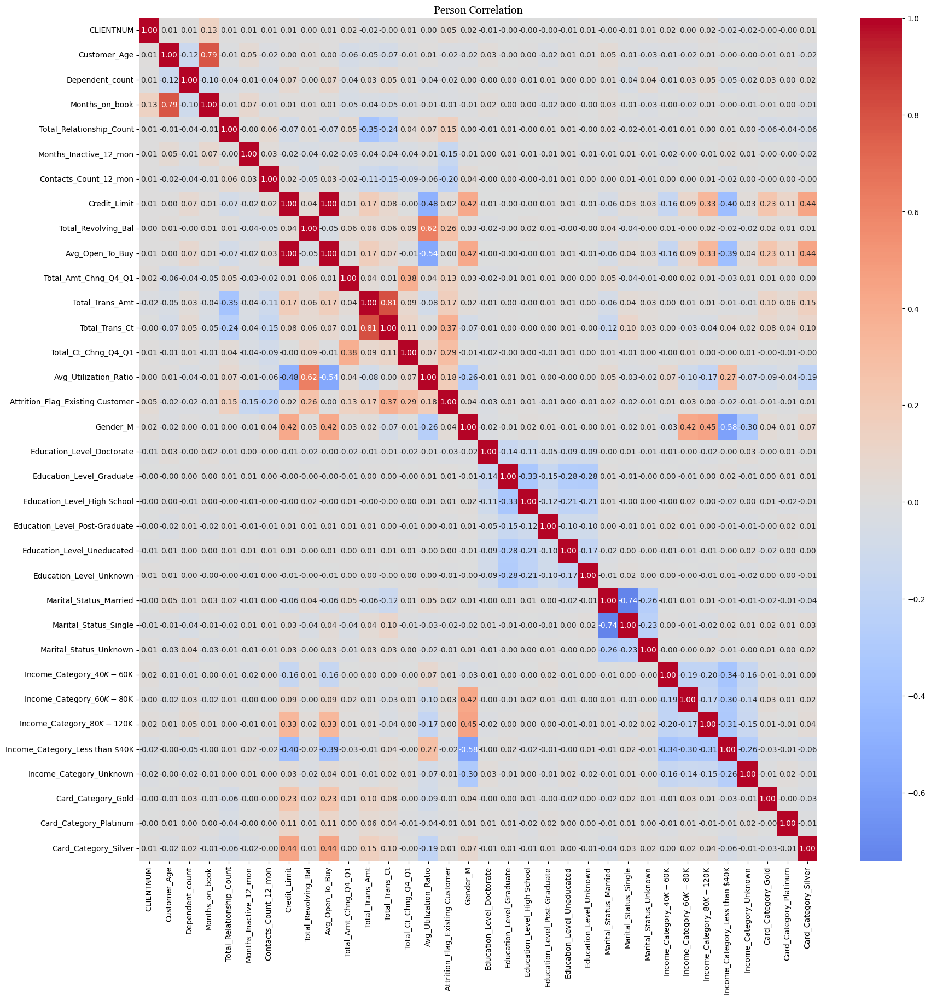

In [29]:
plt.figure(figsize=(20,20))
sns.heatmap(data_final.corr(), cmap='coolwarm', annot=True, fmt='.2f', center=0, cbar=True)
plt.title("Person Correlation", fontname='Georgia', fontsize=14)
plt.show()

In [30]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(data_final)

data_slr = pd.DataFrame(scaler.transform(data_final), columns= data_final.columns)
print("Dataframe to be used for further modelling:")
data_slr.head()

Dataframe to be used for further modelling:


,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,...,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,0.802878,-0.165406,0.503368,0.384621,0.763943,-1.327136,0.492404,0.446622,-0.473422,0.488971,...,-0.798507,-0.282609,-0.463363,2.494645,-0.422675,-0.736437,-0.351212,-0.107644,-0.044484,-0.240794
1,2.156861,0.333570,2.043199,1.010715,1.407306,-1.327136,-0.411616,-0.041367,-0.366667,-0.008486,...,1.252337,-0.282609,-0.463363,-0.400859,-0.422675,1.357890,-0.351212,-0.107644,-0.044484,-0.240794
2,-0.682769,0.583058,0.503368,0.008965,0.120579,-1.327136,-2.219655,-0.573698,-1.426858,-0.445658,...,-0.798507,-0.282609,-0.463363,-0.400859,2.365881,-0.736437,-0.351212,-0.107644,-0.044484,-0.240794
3,0.832862,-0.789126,1.273283,-0.241473,-0.522785,1.641478,-1.315636,-0.585251,1.661686,-0.734100,...,-0.798507,3.538459,-0.463363,-0.400859,-0.422675,1.357890,-0.351212,-0.107644,-0.044484,-0.240794
4,-0.814896,-0.789126,0.503368,-1.869317,0.763943,-1.327136,-2.219655,-0.430877,-1.426858,-0.302868,...,-0.798507,-0.282609,-0.463363,2.494645,-0.422675,-0.736437,-0.351212,-0.107644,-0.044484,-0.240794


## Modeling

### PCA

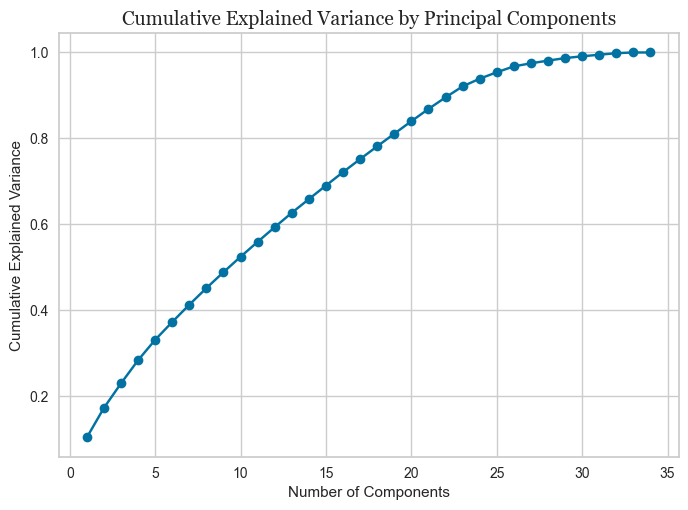

In [186]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

pca = PCA()
pca.fit(data_slr)  # Fits PCA on the data

# Cumulative explained variance plot
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), 
         pca.explained_variance_ratio_.cumsum(), marker='o', linestyle='-')
plt.title("Cumulative Explained Variance by Principal Components", fontname='Georgia', fontsize=14)
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.show()

In [187]:
from sklearn.decomposition import PCA

n_components =3

pca = PCA(n_components=n_components)
pca.fit(data_slr)

columns_list = [f"Feature_{i+1}" for i in range(n_components)]

data_slr_PCA = pd.DataFrame(pca.transform(data_slr), columns=(columns_list))

data_slr_PCA.describe()

,Feature_1,Feature_2,Feature_3
count,1.012700e+04,10127.000000,1.012700e+04
mean,-8.980890e-17,0.000000,1.459395e-16
std,1.873454e+00,1.530226,1.394023e+00
min,-3.041362e+00,-4.680258,-4.480176e+00
25%,-1.408130e+00,-1.013855,-9.595286e-01
50%,-4.349474e-01,0.038639,-1.194477e-02
75%,1.071726e+00,0.947724,9.737477e-01
max,6.145790e+00,5.252508,6.931013e+00


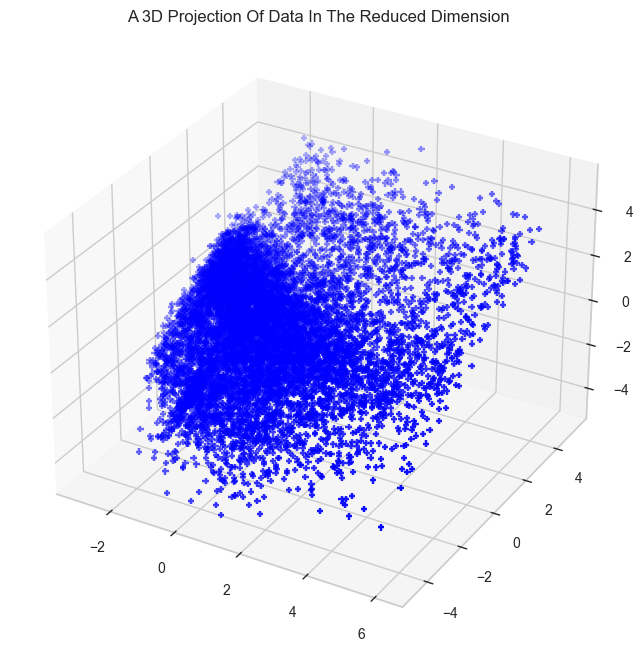

In [188]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Assuming data_slr_PCA is already a pandas DataFrame with reduced dimensions
# Replace 'col1', 'col2', and 'col3' with the actual column names from your PCA result

x = data_slr_PCA["Feature_1"]
y = data_slr_PCA["Feature_2"]
z = data_slr_PCA["Feature_2"]

# Create a figure
fig = plt.figure(figsize=(10, 8))

# Create a 3D subplot
ax = fig.add_subplot(111, projection="3d")

# Scatter plot for the 3D projection
ax.scatter(x, y, z, c="Blue", marker="+")

# Setting the title of the plot
ax.set_title("A 3D Projection Of Data In The Reduced Dimension")

# Show the plot
plt.show()

In [189]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px

# Creating the 3D interactive plot with Plotly
fig = px.scatter_3d(data_slr_PCA, x="Feature_1", y="Feature_2", z="Feature_3",
                    color_discrete_map=cluster_colors)  # Using color_discrete_map for color mapping

# Defining the points
fig.update_traces(marker=dict(
    color='rgba(65, 105, 225, 0.8)',  # Royal Blue
    size=3,  # Increasing the size of the points
    symbol='circle',  # Changing the shape of the markers
    opacity=0.9,  # Making the markers more visible
    line=dict(
        width=0.5,  # Thicker border
        color='rgba(65, 105, 225, 0.4)'  # Darker blue for contrast
    )
))

# Customizing the title font
fig.update_layout(
    title={
        'text': "Principal Component Analysis (PCA) - 3D",
        'y': 0.95,  # Vertical position
        'x': 0.5,  # Centered horizontally
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 25, 'color': 'darkblue', 'family': 'Georgia'}
    },
    paper_bgcolor='white',  # Background color outside the plot
    plot_bgcolor='aliceblue',  # Background color of the plot area
    margin=dict(l=40, r=40, t=40, b=40),  # Margins
    width=1000,
    height=800
)

fig.show()


### UMAP (Uniform Manifold Approximation and Projection) 

In [37]:
# UMAP works with Python 3.9 - 3.12 (I have used Python 3.10)
# %pip install --upgrade pip setuptools wheel (maybe necessary, try install umap-learn first)
# %pip install numba (maybe necessary, try install umap-learn first)
# %pip install umap-learn (necessary)

In [190]:
import umap
import pandas as pd
import plotly.express as px

# Config UMAP
umap_model = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=3, random_state=42)

# Data transformation
data_slr_umap = umap_model.fit_transform(data_slr)

# Converting to DataFrame
data_slr_umap = pd.DataFrame(data_slr_umap, columns=["Feature_1", "Feature_2", "Feature_3"])

c:\Users\danrl\miniconda3\envs\my_env_py_3_10\lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [191]:
# Creating the 3D interactive plot with Plotly
fig = px.scatter_3d(data_slr_umap, x="Feature_1", y="Feature_2", z="Feature_3", title="UMAP 3D Visualization")

# Defining the points
fig.update_traces(marker=dict(
    color='rgba(65, 105, 225, 0.8)',  # Royal Blue
    size=3,  # Reducing the size of the points
    symbol='circle',  # Changing the shape of the markers
    opacity=0.9,  # Making the markers more visible
    line=dict(
        width=0.5,  # Thicker border
        color='rgba(65, 105, 225, 0.4)'  # Darker blue for contrast
    )
))

# Customizing the title font
fig.update_layout(
    title={
        'text': "Uniform Manifold Approximation and Projection (UMAP) - 3D",
        'y': 0.95,  # Vertical position
        'x': 0.5,  # Centered horizontally
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 25, 'color': 'darkblue', 'family': 'Georgia'}
    },
    paper_bgcolor='white',  # Background color outside the plot
    plot_bgcolor='aliceblue',  # Background color of the plot area
    margin=dict(l=40, r=40, t=40, b=40),  # Margins
    width=1000,
    height=800
)

# Displaying the interactive plot
fig.show()

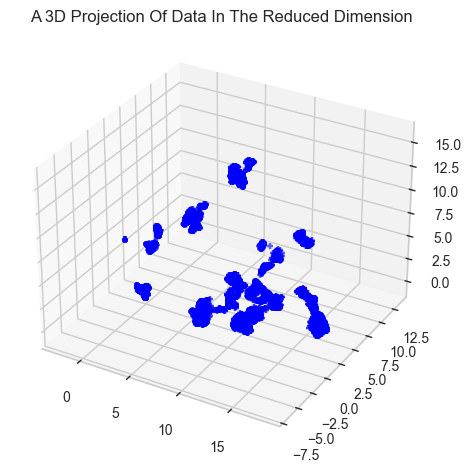

In [192]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import umap
import pandas as pd

# Create a figure
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

# Extract the columns as x, y, z for the scatter plot
x = data_slr_umap['Feature_1']
y = data_slr_umap['Feature_2']
z = data_slr_umap['Feature_3']

# Scatter plot for the 3D projection
ax.scatter(x, y, z, c="Blue", marker="+")

# Setting the title of the plot
ax.set_title("A 3D Projection Of Data In The Reduced Dimension")

# Show the plot
plt.show()

### Clustering

In [193]:
data_slr_reduced = data_slr_PCA # Defining the dimensionality reduction technique to use

### K-Means

In [194]:
# Remove the "Cluster" column from DataFrame data_final
data_final = data_final.drop(columns=["DBSCAN_Cluster"])

In [ ]:
# Remove the "Cluster" column from data_slr_reduced
data_slr_reduced = data_slr_reduced.drop(columns=["DBSCAN_Cluster"])

In [ ]:
# Remove the "Cluster" column from DataFrame data_final
data_final = data_final.drop(columns=["KMeans_Cluster"])

In [173]:
# Remove the "Cluster" column from data_slr_reduced
data_slr_reduced = data_slr_reduced.drop(columns=["KMeans_Cluster"])

Elbow Method to determine the number of clusters to be formed:


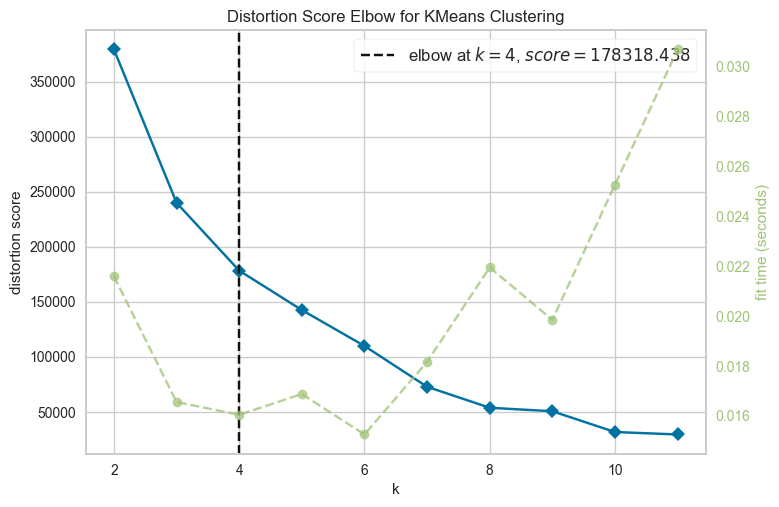

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [126]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import KElbowVisualizer

# Quick examination of elbow method to find numbers of clusters to make.
print('Elbow Method to determine the number of clusters to be formed:')

# Instantiate the clustering model and visualizer
Elbow_Visualizer = KElbowVisualizer(KMeans(), k=(2, 12))

Elbow_Visualizer.fit(data_slr_reduced)

Elbow_Visualizer.show()

The visualizaion above indicates that the ideal number of clusters are 5

In [117]:
kmeans = KMeans(n_clusters=5, random_state=42)

kmeans_cluster_labels = kmeans.fit_predict(data_slr_reduced)

data_final["KMeans_Cluster"] = kmeans_cluster_labels

data_slr_reduced["KMeans_Cluster"] = kmeans_cluster_labels

In [200]:
data_slr_reduced

,Feature_1,Feature_2,Feature_3,DBSCAN_Cluster
0,1.240477,-0.617660,3.567331,0
1,-0.965202,2.387792,3.321747,0
2,0.679564,0.659876,5.377682,0
3,-2.418332,1.940346,3.134792,0
4,0.500799,1.067851,5.062935,0
...,...,...,...,...
10122,0.123599,3.291793,-0.275903,0
10123,-0.460276,0.396661,0.074528,0
10124,-0.742845,-0.823800,-1.199190,0
10125,0.643168,-0.746976,-1.669034,0


In [196]:
data_final

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,...,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,768805383,45,3,39,5,1,3,12691.0,777,11914.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,818770008,49,5,44,6,1,2,8256.0,864,7392.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,713982108,51,3,36,4,1,0,3418.0,0,3418.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,769911858,40,4,34,3,4,1,3313.0,2517,796.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,709106358,40,3,21,5,1,0,4716.0,0,4716.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,50,2,40,3,2,3,4003.0,1851,2152.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10123,710638233,41,2,25,4,2,3,4277.0,2186,2091.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10124,716506083,44,1,36,5,3,4,5409.0,0,5409.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
10125,717406983,30,2,36,4,3,3,5281.0,0,5281.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


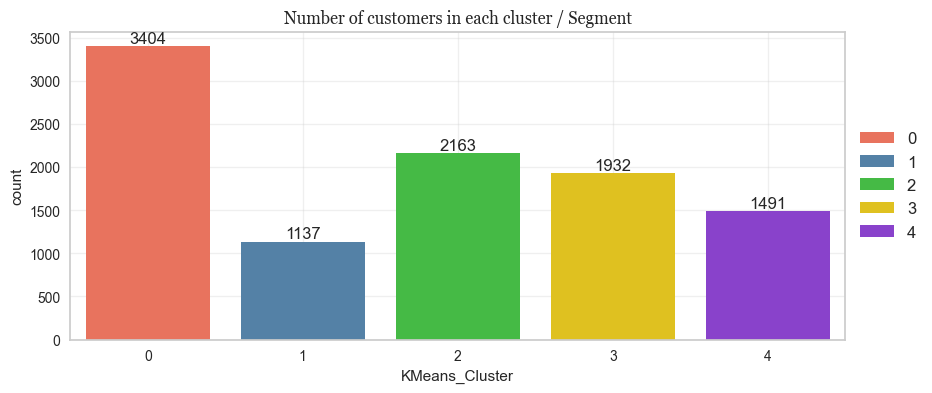

In [120]:
# Create the palette
palette = [cluster_colors[int(cluster)] for cluster in cluster_colors]

# Define the custom colors for each cluster
cluster_colors = {
    0: '#FF6347',  # Tomato Red
    1: '#4682B4',  # Steel Blue
    2: '#32CD32',  # Lime Green
    3: '#FFD700',  # Gold
    4: '#8A2BE2'   # Blue Violet
}

plt.figure(figsize=(10,4), dpi=100)

a = sns.countplot(data=data_final,x='KMeans_Cluster', hue="KMeans_Cluster", palette=cluster_colors)
for i in a.containers: a.bar_label(i,)
plt.title('Number of customers in each cluster / Segment', fontname='Georgia', fontsize=12)
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5), fontsize=12)
plt.grid(alpha=0.3)
plt.show()

In [ ]:
import plotly.express as px

# Define the custom colors for each cluster
cluster_colors = {
    0: '#FF6347',  # Tomato Red
    1: '#4682B4',  # Steel Blue
    2: '#32CD32',  # Lime Green
    3: '#FFD700',  # Gold
    4: '#8A2BE2'   # Blue Violet
}

# Creating the 3D interactive plot with Plotly
fig = px.scatter_3d(data_slr_reduced, x="Feature_1", y="Feature_2", z="Feature_3", 
                    color="KMeans_Cluster",
                    color_discrete_map=cluster_colors)  # Using color_discrete_map to map colors

# Defining the points
fig.update_traces(marker=dict(
    size=4,  # Reducing the size of the points
    symbol='circle',  # Changing the shape of the markers
    opacity=0.9,  # Making the markers more visible
    line=dict(
        width=0.2,  # Thicker border
        color='rgba(50, 50, 50, 0.05)'  # Darker blue for contrast
    )
))

# Customizing the title font
fig.update_layout(
    title={
        'text': "K-Means Clustering with PCA - 3D",
        'y': 0.95,  # Vertical position
        'x': 0.5,  # Centered horizontally
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 25, 'color': 'darkblue', 'family': 'Georgia'}
    },
    paper_bgcolor='white',  # Background color outside the plot
    plot_bgcolor='aliceblue',  # Background color of the plot area
    margin=dict(l=40, r=40, t=40, b=40),  # Margins
    width=1000,
    height=800
)

# Displaying the interactive plot
fig.show()


In [121]:
import plotly.express as px

# Creating the interactive 3D plot with Plotly
fig = px.scatter_3d(data_slr_reduced, x="Feature_1", y="Feature_1", z="Feature_3", 
                    color="KMeans_Cluster", 
                    title="K-Means Clustering with UMAP - 3D",
                    color_discrete_map=cluster_colors)  # Using color_discrete_map to map colors

# Defining the points with specific marker style
fig.update_traces(marker=dict(
    size=4,  # Reducing the size of the points
    opacity=0.9,  # Making the markers more visible
    symbol='circle',  # Changing the shape of the markers
    line=dict(
        width=0.5,  # Thicker border
        color='rgba(65, 105, 225, 0.4)'  # Darker blue for contrast
    )
))

# Customizing the title font and layout
fig.update_layout(
    title={
        'text': "K-Means Clustering with UMAP - 3D",
        'y': 0.95,  # Vertical position
        'x': 0.5,  # Centered horizontally
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 25, 'color': 'darkblue', 'family': 'Georgia'}
    },
    paper_bgcolor='white',  # Background color outside the plot
    plot_bgcolor='aliceblue',  # Background color of the plot area
    margin=dict(l=40, r=40, t=40, b=40),  # Margins
    width=1000,  # Set plot width
    height=800  # Set plot height
)

# Display the plot
fig.show()


In [199]:
data_final.head(10)

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,...,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,DBSCAN_Cluster
0,768805383,45,3,39,5,1,3,12691.0,777,11914.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,818770008,49,5,44,6,1,2,8256.0,864,7392.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0
2,713982108,51,3,36,4,1,0,3418.0,0,3418.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0
3,769911858,40,4,34,3,4,1,3313.0,2517,796.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0
4,709106358,40,3,21,5,1,0,4716.0,0,4716.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0
5,713061558,44,2,36,3,1,2,4010.0,1247,2763.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
6,810347208,51,4,46,6,1,3,34516.0,2264,32252.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0
7,818906208,32,0,27,2,2,2,29081.0,1396,27685.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0
8,710930508,37,3,36,5,2,0,22352.0,2517,19835.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0
9,719661558,48,2,36,6,3,3,11656.0,1677,9979.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0


In [128]:
from sklearn.metrics import silhouette_score
score = silhouette_score(data_slr_reduced, kmeans_cluster_labels)
print(f'Silhouette Score: {score}')

Silhouette Score: 0.46509572863578796


### DBSCAN

In [ ]:
# Remover a coluna "Cluster" do DataFrame data_final
data_final = data_final.drop(columns=["KMeans_Cluster"])

In [ ]:
# Se você deseja remover a coluna "Cluster" de outro DataFrame, como data_slr_PCA:
#data_slr_PCA = data_slr_PCA.drop(columns=["KMeans_Cluster"])

data_slr_reduced = data_slr_reduced.drop(columns=["KMeans_Cluster"])

In [262]:
# Remover a coluna "Cluster" do DataFrame data_final
data_final = data_final.drop(columns=["DBSCAN_Cluster"])

# Se você deseja remover a coluna "Cluster" de outro DataFrame, como data_slr_PCA:
data_slr_reduced = data_slr_reduced.drop(columns=["DBSCAN_Cluster"])

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np

# Testing different values of eps and min_samples
eps_values = np.arange(4, 6, 0.5)
min_samples_values = range(15, 40, 5)

best_score = -1
best_eps = None
best_min_samples = None

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        dbscan_cluster_labels = dbscan.fit_predict(data_slr_reduced)

        # Ignore -1 labels (outliers) for calculating the Silhouette Score
        if len(set(dbscan_cluster_labels)) > 1:  # If there is more than 1 cluster
            score = silhouette_score(data_slr_reduced, dbscan_cluster_labels)
            print(f"Silhouette Score for eps={eps}, min_samples={min_samples}: {score}")

            if score > best_score:
                best_score = score
                best_eps = eps
                best_min_samples = min_samples

print(f"\nThe best Silhouette Score: {best_score} with eps={best_eps} and min_samples={best_min_samples}")

In [263]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

# DBSCAN Parameters
dbscan = DBSCAN(eps=0.7, min_samples=35)  # You can adjust eps and min_samples to test different results

# Fitting DBSCAN and getting cluster labels
dbscan_cluster_labels = dbscan.fit_predict(data_slr_reduced)

# Assigning cluster labels to the data
data_slr_reduced["DBSCAN_Cluster"] = dbscan_cluster_labels
data_final["DBSCAN_Cluster"] = dbscan_cluster_labels

# Calculating the Silhouette Score for DBSCAN
silhouette_avg = silhouette_score(data_slr_reduced, dbscan_cluster_labels)
print(f"DBSCAN Silhouette Score: {silhouette_avg}")

DBSCAN Silhouette Score: 0.35507387194508816


In [264]:
data_slr_reduced

,Feature_1,Feature_2,Feature_3,DBSCAN_Cluster
0,1.240477,-0.617660,3.567331,-1
1,-0.965202,2.387792,3.321747,-1
2,0.679564,0.659876,5.377682,-1
3,-2.418332,1.940346,3.134792,-1
4,0.500799,1.067851,5.062935,-1
...,...,...,...,...
10122,0.123599,3.291793,-0.275903,0
10123,-0.460276,0.396661,0.074528,0
10124,-0.742845,-0.823800,-1.199190,0
10125,0.643168,-0.746976,-1.669034,0


In [265]:
data_final

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,...,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,DBSCAN_Cluster
0,768805383,45,3,39,5,1,3,12691.0,777,11914.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,-1
1,818770008,49,5,44,6,1,2,8256.0,864,7392.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-1
2,713982108,51,3,36,4,1,0,3418.0,0,3418.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-1
3,769911858,40,4,34,3,4,1,3313.0,2517,796.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-1
4,709106358,40,3,21,5,1,0,4716.0,0,4716.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,50,2,40,3,2,3,4003.0,1851,2152.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
10123,710638233,41,2,25,4,2,3,4277.0,2186,2091.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
10124,716506083,44,1,36,5,3,4,5409.0,0,5409.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0
10125,717406983,30,2,36,4,3,3,5281.0,0,5281.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


C:\Users\danrl\AppData\Local\Temp\ipykernel_24728\3751684774.py:6: UserWarning:

The palette list has more values (5) than needed (2), which may not be intended.



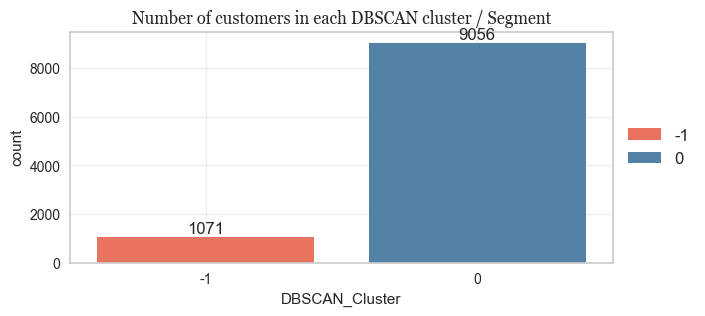

In [266]:
# Create the palette
palette = [cluster_colors[int(cluster)] for cluster in cluster_colors]

plt.figure(figsize=(7,3), dpi=100)

a = sns.countplot(data=data_final,x='DBSCAN_Cluster', hue="DBSCAN_Cluster", palette=palette)
for i in a.containers: a.bar_label(i,)

plt.title('Number of customers in each DBSCAN cluster / Segment', fontname='Georgia', fontsize=12)

# Legenda posicionada na lateral direita
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5), fontsize=12)

# Exibir grid e plot
plt.grid(alpha=0.3)

plt.show()

In [267]:
import plotly.express as px

# Creating the interactive 3D plot with Plotly
fig = px.scatter_3d(data_slr_reduced, x="Feature_1", y="Feature_2", z="Feature_3", 
                    color="DBSCAN_Cluster", 
                    title="DBSCAN Clustering with PCA - 3D",
                    color_discrete_map=cluster_colors)  # Using color_discrete_map to map colors

# Defining the points with specific marker style
fig.update_traces(marker=dict(
    size=4,  # Reducing the size of the points (size can be adjusted as needed)
    opacity=0.9,  # Making the markers more visible
    symbol='circle',  # Changing the shape of the markers
    line=dict(
        width=0.5,  # Thicker border around the points
        color='rgba(65, 105, 225, 0.4)'  # Darker blue for contrast around the points
    )
))

# Customizing the title font and layout
fig.update_layout(
    title={
        'text': "DBSCAN Clustering with PCA - 3D",
        'y': 0.95,  # Vertical position of the title
        'x': 0.5,  # Centering the title horizontally
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 25, 'color': 'darkblue', 'family': 'Georgia'}  # Title font customization
    },
    paper_bgcolor='white',  # Background color outside the plot
    plot_bgcolor='aliceblue',  # Background color of the plot area
    margin=dict(l=40, r=40, t=40, b=40),  # Setting the margins of the plot
    width=1000,  # Setting plot width
    height=800  # Setting plot height
)

# Displaying the plot
fig.show()

In [168]:
import plotly.express as px

# Creating the interactive 3D plot with Plotly
fig = px.scatter_3d(data_slr_reduced, x="Feature_1", y="Feature_2", z="Feature_3", 
                    color="DBSCAN_Cluster", 
                    title="DBSCAN Clustering with UMAP - 3D",
                    color_discrete_map=cluster_colors)  # Using color_discrete_map to map colors

# Defining the points with specific marker style
fig.update_traces(marker=dict(
    size=5,  # Reducing the size of the points (size can be adjusted as needed)
    opacity=0.8,  # Making the markers more visible
    symbol='circle',  # Changing the shape of the markers
))

# Customizing the title font and layout
fig.update_layout(
    title={
        'text': "DBSCAN Clustering with UMAP - 3D",
        'y': 0.95,  # Vertical position of the title
        'x': 0.5,  # Centering the title horizontally
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 25, 'color': 'darkblue', 'family': 'Georgia'}  # Title font customization
    },
    paper_bgcolor='white',  # Background color outside the plot
    plot_bgcolor='aliceblue',  # Background color of the plot area
    margin=dict(l=40, r=40, t=40, b=40),  # Setting the margins of the plot
    width=1000,  # Setting plot width
    height=800  # Setting plot height
)

# Displaying the plot
fig.show()


### Evaluation

In [208]:
data_final

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,...,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,KMeans_Cluster
0,768805383,45,3,39,5,1,3,12691.0,777,11914.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2
1,818770008,49,5,44,6,1,2,8256.0,864,7392.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0
2,713982108,51,3,36,4,1,0,3418.0,0,3418.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2
3,769911858,40,4,34,3,4,1,3313.0,2517,796.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0
4,709106358,40,3,21,5,1,0,4716.0,0,4716.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,50,2,40,3,2,3,4003.0,1851,2152.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
10123,710638233,41,2,25,4,2,3,4277.0,2186,2091.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
10124,716506083,44,1,36,5,3,4,5409.0,0,5409.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,3
10125,717406983,30,2,36,4,3,3,5281.0,0,5281.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3


In [209]:
data["KMeans_Cluster"] = kmeans_cluster_labels
data

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,KMeans_Cluster
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,2
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,2
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,1
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,1
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,3
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,3


In [210]:
data_dictionary

,Column name,Description
0,CLIENTNUM,Unique identifier for each customer
1,Attrition_Flag,Indicates if the customer is active or has churned (Attrited/Existing)
2,Customer_Age,Age of the customer
3,Gender,Gender of the customer (M/F)
4,Dependent_count,Number of dependents the customer has
5,Education_Level,Education level of the customer
6,Marital_Status,Marital status of the customer
7,Income_Category,Income category of the customer
8,Card_Category,"Type of card held by the customer (e.g., Blue, Silver, Gold, Platinum)"
9,Months_on_book,Number of months the customer has been with the bank


In [211]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

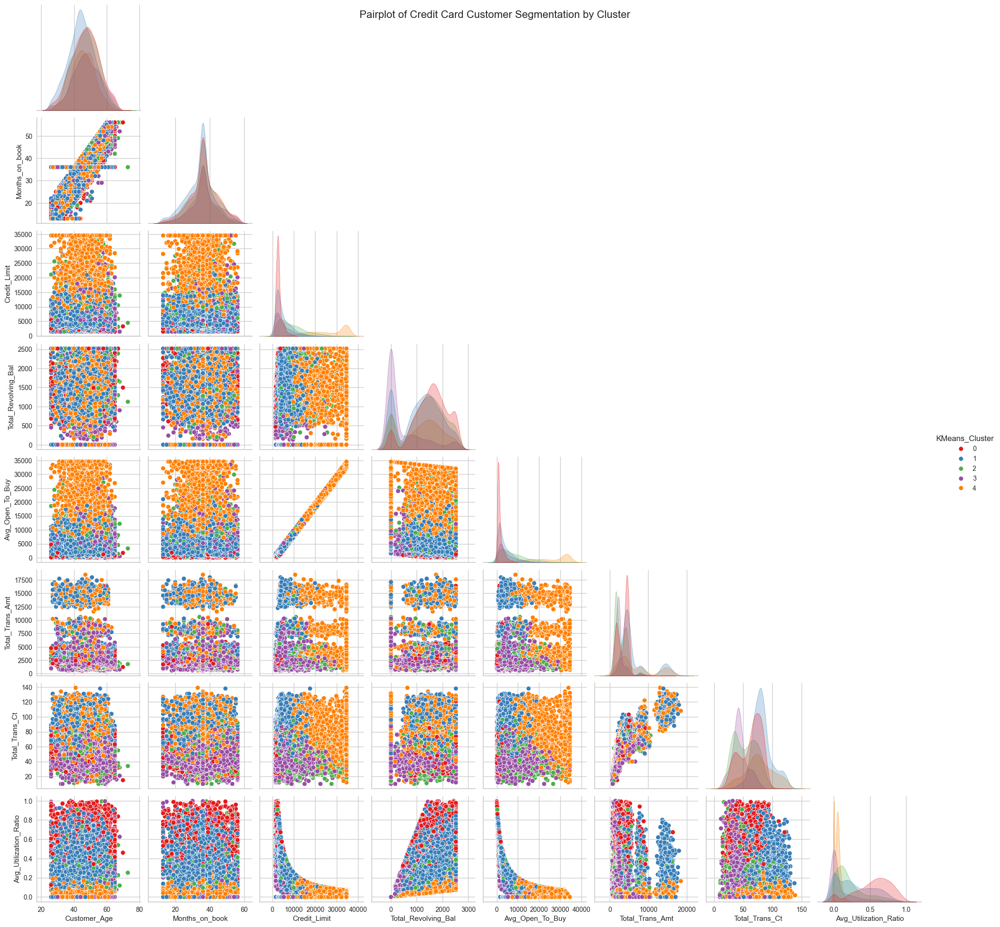

In [212]:
features_to_plot = ["Customer_Age", "Dependent_count", "Months_on_book", "Total_Relationship_Count", 
                   "Months_Inactive_12_mon", "Contacts_Count_12_mon", "Credit_Limit", "Total_Revolving_Bal", "Avg_Open_To_Buy", 
                   "Total_Amt_Chng_Q4_Q1", "Total_Trans_Amt", "Total_Trans_Ct", "Total_Ct_Chng_Q4_Q1", "Avg_Utilization_Ratio"]

features_to_plot_3 = ["Customer_Age", "Months_on_book", "Credit_Limit", "Total_Revolving_Bal", "Avg_Open_To_Buy",  "Total_Trans_Amt", "Total_Trans_Ct", "Avg_Utilization_Ratio"]

sns.pairplot(data_final, vars = features_to_plot_3, hue="KMeans_Cluster", corner=True, palette='Set1')
plt.suptitle("Pairplot of Credit Card Customer Segmentation by Cluster", size=16)
plt.show()

In [ ]:
# Iterar sobre todas as colunas numéricas para plotar histogramas
numeric_columns = data_final.select_dtypes(include=['float64', 'int64']).columns

# Plotar cada variável em um gráfico separado
for col in numeric_columns:
    plt.figure(figsize=(5, 3))
    sns.histplot(data=data_final, x=col, hue='KMeans_Cluster', kde=True, palette='Set2', bins=30, alpha=0.6)
    plt.title(f'Distribution of {col} by KMeans Cluster')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.legend(title='Cluster')
    plt.show()

In [214]:
import pandas as pd

# Lista de variáveis para análise
variables = ["Customer_Age", "Months_on_book", "Credit_Limit", "Total_Revolving_Bal", 
             "Avg_Open_To_Buy", "Total_Trans_Amt", "Total_Trans_Ct", "Avg_Utilization_Ratio"]

# Dicionário para armazenar as estatísticas descritivas
cluster_summary = pd.DataFrame()

# Calculando estatísticas descritivas para cada variável, agrupadas por cluster
for variable in variables:
    summary = data_final.groupby('KMeans_Cluster')[variable].describe().reset_index()
    summary['Variable'] = variable  # Adiciona o nome da variável como coluna
    cluster_summary = pd.concat([cluster_summary, summary], ignore_index=True)

# Exibindo o resumo completo
cluster_summary

,KMeans_Cluster,count,mean,std,min,25%,50%,75%,max,Variable
0,0,2375.0,46.961684,8.368149,26.0,41.000,47.000,53.00000,70.000,Customer_Age
1,1,2513.0,44.550736,7.956535,26.0,39.000,44.000,50.00000,65.000,Customer_Age
2,2,2230.0,46.917937,7.721544,26.0,41.000,47.000,53.00000,73.000,Customer_Age
3,3,1567.0,47.790045,8.425086,26.0,42.000,48.000,54.00000,68.000,Customer_Age
4,4,1442.0,45.866158,6.876686,26.0,41.000,46.000,51.00000,65.000,Customer_Age
5,0,2375.0,36.420632,8.268014,13.0,32.000,36.000,41.00000,56.000,Months_on_book
6,1,2513.0,34.230800,7.886136,13.0,30.000,36.000,38.00000,56.000,Months_on_book
7,2,2230.0,36.516592,7.721280,13.0,32.000,36.000,41.00000,56.000,Months_on_book
8,3,1567.0,37.396937,8.339274,13.0,34.000,36.000,42.00000,56.000,Months_on_book
9,4,1442.0,35.570735,7.137360,13.0,32.000,36.000,39.00000,56.000,Months_on_book


In [232]:
# Calculating Statistics of Each Feature by Clusters
cluster_means = data_final[variables + ['KMeans_Cluster']].groupby('KMeans_Cluster').mean()
cluster_stds = data_final[variables + ['KMeans_Cluster']].groupby('KMeans_Cluster').std()
cluster_mins = data_final[variables + ['KMeans_Cluster']].groupby('KMeans_Cluster').min()
cluster_maxs = data_final[variables + ['KMeans_Cluster']].groupby('KMeans_Cluster').max()

# Defining business rules to determine the characteristics of each cluster
for cluster_id in range(len(cluster_means)):
    print(f"\nCluster {cluster_id} Characteristics:")
    cluster_data = cluster_means.loc[cluster_id]
    
    if cluster_data['Credit_Limit'] > 20000:
        print("  - This cluster has a high average credit limit, indicating customers with higher purchasing power.")
    if cluster_data['Avg_Utilization_Ratio'] > 0.5:
        print("  - This cluster shows a high credit utilization ratio, suggesting customers with higher debt levels.")
    if cluster_data['Avg_Open_To_Buy'] > 10000:
        print("  - This cluster has a high average open-to-buy value, indicating customers with good purchasing capacity.")
    if cluster_data['Total_Trans_Amt'] > 5000:
        print("  - This cluster consists of highly active customers with a high total transaction amount.")
    if cluster_data['Customer_Age'] < 30:
        print("  - This cluster has a low average age, indicating younger customers.")
    if cluster_data['Total_Revolving_Bal'] > 1500:
        print("  - This cluster has a high revolving balance, indicating customers facing financial difficulties.")

# Example of assigning names to clusters based on their average characteristics
cluster_names = {}
for cluster_id in range(len(cluster_means)):
    cluster_data = cluster_means.loc[cluster_id]
    cluster_name = "Cluster "
    
    if cluster_data['Credit_Limit'] > 20000:
        cluster_name += "High Credit Limit"
    if cluster_data['Avg_Utilization_Ratio'] > 0.5:
        cluster_name += " with High Credit Utilization"
    
    cluster_names[cluster_id] = cluster_name

# Displaying cluster names
print("\nCluster Names:")
cluster_names


Cluster 0 Characteristics:
  - This cluster shows a high credit utilization ratio, suggesting customers with higher debt levels.
  - This cluster has a high revolving balance, indicating customers facing financial difficulties.

Cluster 1 Characteristics:
  - This cluster consists of highly active customers with a high total transaction amount.

Cluster 2 Characteristics:

Cluster 3 Characteristics:

Cluster 4 Characteristics:
  - This cluster has a high average credit limit, indicating customers with higher purchasing power.
  - This cluster has a high average open-to-buy value, indicating customers with good purchasing capacity.
  - This cluster consists of highly active customers with a high total transaction amount.

Cluster Names:


{0: 'Cluster  with High Credit Utilization',
 1: 'Cluster ',
 2: 'Cluster ',
 3: 'Cluster ',
 4: 'Cluster High Credit Limit'}

In [233]:
cluster_means

,Customer_Age,Months_on_book,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Trans_Amt,Total_Trans_Ct,Avg_Utilization_Ratio
KMeans_Cluster,,,,,,,,
0,46.961684,36.420632,3098.679284,1533.964632,1564.714653,3548.215579,62.996211,0.546352
1,44.550736,34.230800,5075.678392,1136.616395,3939.061998,6347.742539,82.213291,0.297230
2,46.917937,36.516592,9433.187220,1334.004933,8099.182287,2923.260538,53.901794,0.221646
3,47.790045,37.396937,5572.462987,450.382259,5122.080728,2481.040842,43.800893,0.113719
4,45.866158,35.570735,26028.567961,1106.626214,24921.941748,6806.262829,77.509709,0.046363


In [234]:
cluster_maxs

,Customer_Age,Months_on_book,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Trans_Amt,Total_Trans_Ct,Avg_Utilization_Ratio
KMeans_Cluster,,,,,,,,
0,70,56,10953.0,2517,9149.0,16401,121,0.992
1,65,56,21691.0,2517,21030.0,17995,138,0.951
2,73,56,34516.0,2517,33729.0,16191,116,0.994
3,68,56,34516.0,2517,34516.0,10291,87,0.999
4,65,56,34516.0,2517,34516.0,18484,139,0.253


In [235]:
# Categorical features to analyze
categorical_features = ["Attrition_Flag", "Gender", "Education_Level", "Marital_Status", "Income_Category", "Card_Category"]

freq_table = {}
proportion_table = {}

# Calculating frequency and proportion for each category within each cluster
for feature in categorical_features:
    print(f"\nStatistics for {feature} by Cluster:")
    
    # Frequency count
    freq_table[feature] = data.groupby('KMeans_Cluster')[feature].value_counts().unstack().fillna(0)
    print("Frequency Table:")
    print(freq_table[feature])
    
    # Proportion (percentage)
    proportion_table[feature] = freq_table[feature].div(freq_table[feature].sum(axis=1), axis=0) * 100
    print("\nProportion Table (in %):")
    print(proportion_table[feature])


Statistics for Attrition_Flag by Cluster:
Frequency Table:
Attrition_Flag  Attrited Customer  Existing Customer
KMeans_Cluster                                      
0                              99               2276
1                              72               2441
2                             126               2104
3                            1162                405
4                             168               1274

Proportion Table (in %):
Attrition_Flag  Attrited Customer  Existing Customer
KMeans_Cluster                                      
0                        4.168421          95.831579
1                        2.865101          97.134899
2                        5.650224          94.349776
3                       74.154435          25.845565
4                       11.650485          88.349515

Statistics for Gender by Cluster:
Frequency Table:
Gender             F     M
KMeans_Cluster            
0               2022   353
1               2033   480
2           

In [236]:
freq_table["Attrition_Flag"]

Attrition_Flag,Attrited Customer,Existing Customer
KMeans_Cluster,,
0,99,2276
1,72,2441
2,126,2104
3,1162,405
4,168,1274


In [237]:
freq_table["Card_Category"]

Card_Category,Blue,Gold,Platinum,Silver
KMeans_Cluster,,,,
0,2375.0,0.0,0.0,0.0
1,2402.0,19.0,2.0,90.0
2,2198.0,2.0,0.0,30.0
3,1537.0,3.0,2.0,25.0
4,924.0,92.0,16.0,410.0


In [238]:
freq_table["Education_Level"]

Education_Level,College,Doctorate,Graduate,High School,Post-Graduate,Uneducated,Unknown
KMeans_Cluster,,,,,,,
0,243,93,754,487,130,332,336
1,240,108,779,487,116,390,393
2,231,84,672,495,120,315,313
3,159,104,483,275,69,222,255
4,140,62,440,269,81,228,222


In [239]:
freq_table["Gender"]

Gender,F,M
KMeans_Cluster,,
0,2022,353
1,2033,480
2,149,2081
3,1017,550
4,137,1305


In [240]:
freq_table["Income_Category"]

Income_Category,$120K +,$40K - $60K,$60K - $80K,$80K - $120K,Less than $40K,Unknown
KMeans_Cluster,,,,,,
0,38,573,42,12,1488,222
1,51,502,96,44,1397,423
2,251,296,798,752,29,104
3,83,325,154,117,634,254
4,304,94,312,610,13,109


In [241]:
freq_table["Marital_Status"]

Marital_Status,Divorced,Married,Single,Unknown
KMeans_Cluster,,,,
0,180,1715,350,130
1,184,407,1695,227
2,136,1565,388,141
3,122,556,779,110
4,126,444,731,141


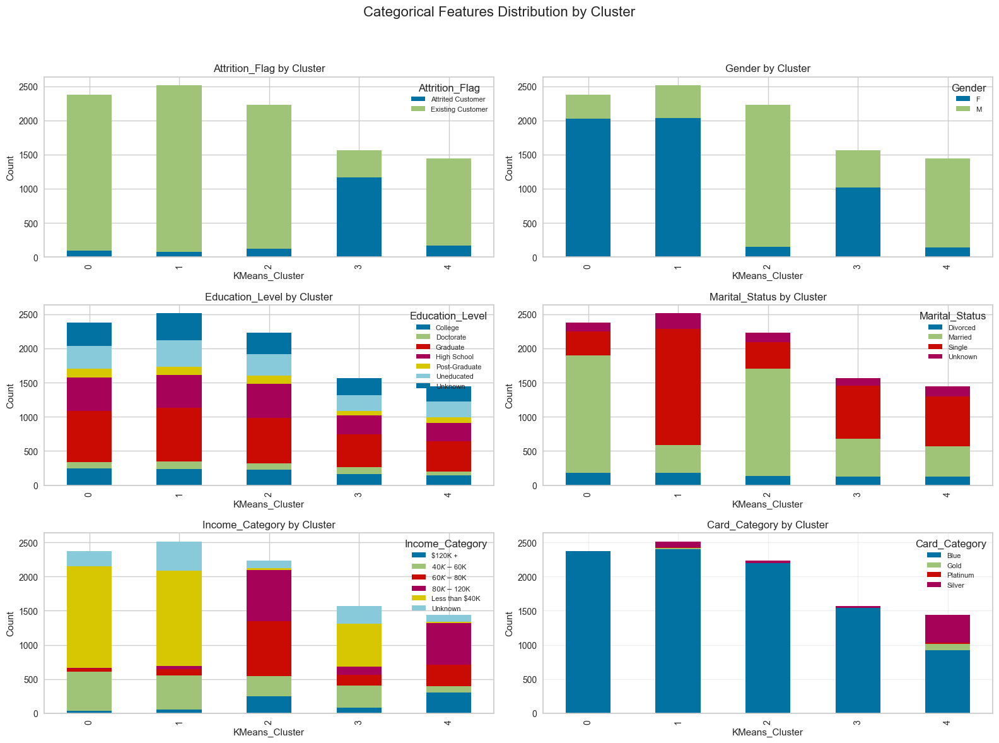

In [250]:
# Example: Plotting multiple features in one figure
fig, axes = plt.subplots(3, 2, figsize=(16, 12))
fig.suptitle('Categorical Features Distribution by Cluster', fontsize=16)

features = ["Attrition_Flag", "Gender", "Education_Level", "Marital_Status", "Income_Category", "Card_Category"]
for ax, feature in zip(axes.flatten(), features):
    freq_table[feature].plot(kind='bar', ax=ax, stacked=True)
    ax.set_title(f'{feature} by Cluster')
    ax.set_ylabel('Count')
    ax.set_xlabel('KMeans_Cluster')
    ax.legend(title=feature, loc="best", fontsize=8)

plt.grid(alpha=0.3)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


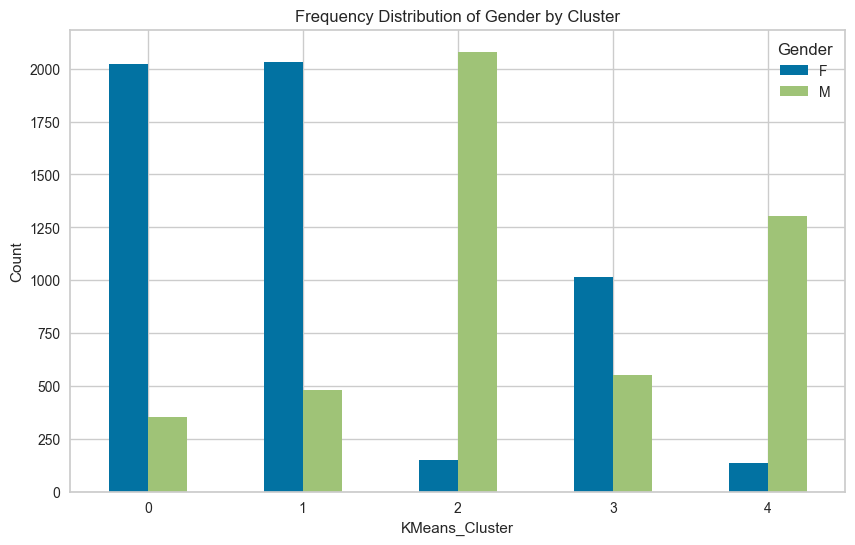

In [245]:
import seaborn as sns
import matplotlib.pyplot as plt

# Example: Frequency distribution of "Gender" across clusters
feature = "Gender"
freq_table[feature].plot(kind='bar', figsize=(10, 6))
plt.title(f'Frequency Distribution of {feature} by Cluster')
plt.ylabel('Count')
plt.xlabel('KMeans_Cluster')
plt.xticks(rotation=0)
plt.legend(title=feature)
plt.show()

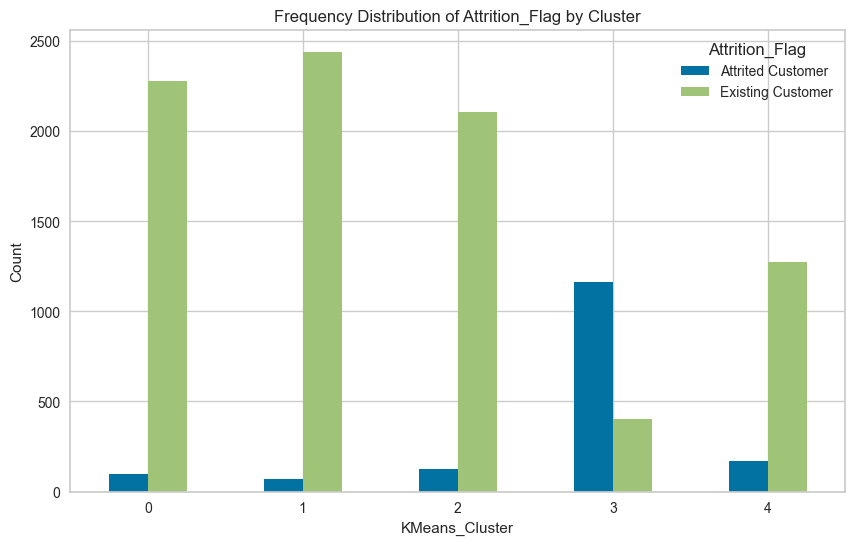

In [246]:
import seaborn as sns
import matplotlib.pyplot as plt

# Example: Frequency distribution of "Gender" across clusters
feature = "Attrition_Flag"
freq_table[feature].plot(kind='bar', figsize=(10, 6))
plt.title(f'Frequency Distribution of {feature} by Cluster')
plt.ylabel('Count')
plt.xlabel('KMeans_Cluster')
plt.xticks(rotation=0)
plt.legend(title=feature)
plt.show()

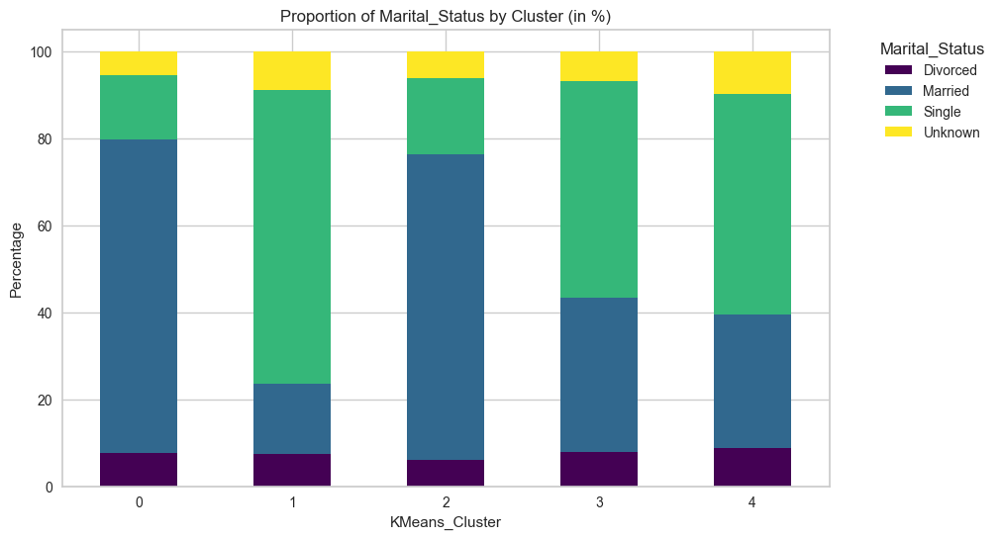

In [247]:
# Example: Proportion distribution of "Marital_Status" across clusters
feature = "Marital_Status"
proportion_table[feature].plot(kind='bar', stacked=True, figsize=(10, 6), colormap='viridis')
plt.title(f'Proportion of {feature} by Cluster (in %)')
plt.ylabel('Percentage')
plt.xlabel('KMeans_Cluster')
plt.legend(title=feature, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=0)
plt.show()


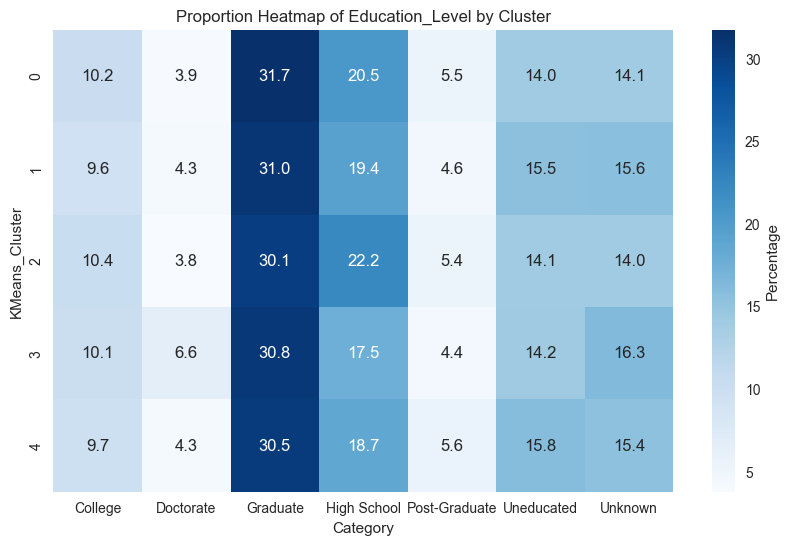

In [248]:
# Example: Heatmap of proportions for "Education_Level"
feature = "Education_Level"
plt.figure(figsize=(10, 6))
sns.heatmap(proportion_table[feature], annot=True, fmt=".1f", cmap="Blues", cbar_kws={'label': 'Percentage'})
plt.title(f'Proportion Heatmap of {feature} by Cluster')
plt.xlabel('Category')
plt.ylabel('KMeans_Cluster')
plt.show()

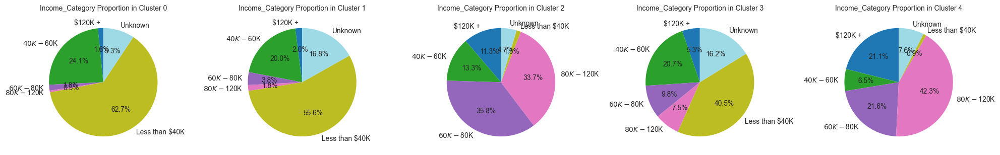

In [249]:
import matplotlib.pyplot as plt

# Feature to analyze
feature = "Income_Category"

# Number of clusters in your data
num_clusters = len(proportion_table[feature])

# Create subplots to hold pie charts for each cluster
# Increase the figsize to make the overall figure bigger
fig, axes = plt.subplots(1, num_clusters, figsize=(20, 18))  # Increased figsize here

# Loop through each cluster and plot a pie chart
for cluster_id in range(num_clusters):
    ax = axes[cluster_id]
    proportion_table[feature].loc[cluster_id].plot(kind='pie', autopct='%1.1f%%', startangle=90, colormap='tab20', ax=ax, fontsize=10)
    ax.set_title(f'{feature} Proportion in Cluster {cluster_id}', fontsize=10)  # Adjust title font size
    ax.set_ylabel('')  # Remove ylabel
    ax.set_xlabel('')  # Remove xlabel
    
    
# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

## Customer Profilling

### | Clusters 0 "Mid-Income"
####  Observations:
- Credit Limit: ~3,099, indicating a relatively lower credit limit compared to other clusters.
- Total Revolving Balance: ~1,534, showing a higher revolving balance compared to other clusters (outstanding credit card balance).
- Avg Open to Buy: ~1,565, indicating the lower amount of available credit for customers to spend.
- Total Transaction Amount: ~3,548, suggesting moderate overall spending activity.
- Total Transactions Count: ~63 transactions, indicating customers are moderately active in making transactions.
- Avg Utilization Ratio: ~0.55, meaning these customers use about 55% of their available credit.
- Predominantly Female: Cluster 0 has a very high number of Female customers (2022), representing approximately 85% of the cluster, indicating that this cluster is predominantly female.

#### Inferences:
- Moderate spenders: Customers in this cluster have low credit limits, with relatively high credit utilization.
- Lower purchasing power: This customers have lower credit capability and even so use more their available credit compared to other custumers.

#### Recomendations:
- Financial Planning Services can be a good fit for thise clusters. Offer financial advice for families (most of them are married), including education savings, wealth management, and retirement planning. Emphasize stability and security in marketing campaigns.

--------------------------------------------- // ---------------------------------------------

### | Clusters 1 "Highly Active Consumers"
####  Observations:
- Credit Limit: ~5,076, similar to Cluster 2, but only  2.87% has attrited. Which can be a good fit to see if there is some information to help with cluster 2.
- Total Revolving Balance: ~1,137, moderate balance, similar to Cluster 3.
- Avg Open to Buy: ~3,939, indicating a more moderate available credit.
- Total Transaction Amount: ~6,348, indicating higher transaction activity, close to cluster 3, but they have less purchasing power. Also, the total trasactions (in number): ~82, the highest transaction count.
- Avg Utilization Ratio: ~0.29, indicating a moderate usage of available credit.
- Predominantly Female: Similar to Cluster 0, Cluster 4 has a high number of women (2033), representing roughly 80% of the cluster.

#### Inferences:
- Frequent transaction activity: They exhibit a high frequency of transactions, which suggests they are regular users of their credit cards.

#### Recomendations:
- Study why these customers are staying so loyal and try to replicate these successful retention strategies for other clusters.

--------------------------------------------- // ---------------------------------------------

### | Clusters 2 "Stable with Available Money"
####  Observations:
- Credit Limit: ~9,433, significantly higher than Cluster 0, indicating wealthier or more creditworthy individuals.
- Total Revolving Balance: ~1,334, slightly lower than Cluster 0, suggesting less debt.
- Avg Open to Buy: ~8,099, which is much higher than Cluster 0, indicating a greater available credit for spending.
- Total Transaction Amount: ~2,923, lower than Cluster 0, indicating moderate activity.
- Avg Utilization Ratio: ~0.22, significantly lower than Cluster 0, indicating these customers use a smaller proportion of their credit.
- Male Dominated: Cluster 1 is almost entirely made up of Male customers (2081), with only a small proportion of Female customers (149).

#### Inferences:
- They appear to be middle class more stable: due to their credit limits, income category, also they use moderatly their credit
- Higher credit limits compared to other clusters: With higher available credit, these customers may have better financial standing and more disposable income.

#### Recomendations:
- This cluster is more stable, and with much more men married then other clusters. So, Invest in specific produtcs for family, insurance, and some sports can be interesting to create more moviment in their account.

--------------------------------------------- // ---------------------------------------------

### | Clusters 3 "Attrited Customers"
####  Observations:
- First of all, this cluster presents a Attrition rate of 74.23%, which indicates that a large portion of customers in this cluster have left the bank. So, this is a indicative that many others values are impacted by that. For example, we ca see:
- Credit Limit: ~5,572, indicating a less wealthy demographic or lower creditworthiness.
- Total Revolving Balance: ~450, much lower than in other clusters, indicating less debt or it is because of the overall attrition rate.
- Total Transactions Count: ~44, fewer transactions than the other clusters and also, Avg Utilization Ratio: ~0.11, very low.
- Balanced Gender Representation: With a more balanced gender distribution.

#### Inferences:
- Based on the previous financial metrics, Cluster 2 had low credit limits, low spending activity, and low credit utilization, which might suggest these customers were not very engaged or interested in maintaining their relationship with the bank. The high attrition could be due to financial limitations or dissatisfaction with the bank's services.

- Consideration: The model has created basically a cluster with the majority of people that was churned with the bank, it is intersting to more investigation and handle this custumers in a specific way. However, we yet has a ~26% of this cluster that are achive customers, hence we need to understand other features and caracteristis of this same cluster that can be used to recover the relationship with the others 74%.

#### Recomendations:
- A futher investigation more accurate must be done to understant if these custumers can be recovery. Understand nuances between them is important, so, maybe create new subclusters can be interesting to plan different approachs.



--------------------------------------------- // ---------------------------------------------

### | Clusters 4 "Financially Wealthy"
#### Observations:
- Credit Limit: ~26,029, the highest among all clusters, indicating very high creditworthiness or affluent customers.
- Total Revolving Balance: ~1,107, moderate revolving balance.
- Avg Open to Buy: ~24,922, which is very high, indicating ample available credit.
- Total Transaction Amount: ~6,806, the highest spending amount, indicating highly active customers.
- Avg Utilization Ratio: ~0.05, very low, showing that they use only a small portion of their available credit. However, they have much more available credit them others.
- Male Dominated: Cluster 3 is highly Male-dominated, with 1305 males compared to only 137 women.
- Balanced relationship status.


#### Inferences:
- High credit capacity and activity: These customers have very high credit limits and are highly active, making a large number of transactions.
- Financially wealthy or elite: The high credit limit and low utilization suggest they are financially stable, not reliant on credit, and have a lot of available spending power.
- Frequent spenders: They are also highly engaged with their credit, making more transactions than any other cluster.

#### Recomendations:
- Work on specific premium products to keep the base active and consuming the bank's product. There are a lot of blue credit card customers, those maybe can enter in a high level of card due to their finantial power. This cluster could respond well to dual-focused marketing that targets both family-related services and individual financial growth tools.

## Important Notes:

Some other things can be done to improve the results and quality of this work, such as:

1. The Dimenstion Reduction (Which tecnique perform better), test also t-SNE with other cluster models.
2. What features are more impactfull for decide what cluster some instance must be
3. Test other clusters: Agglomerative Cluster and Gaussina Mixture Models (GMM).
4. Assess the correlation of features with clusters using statistical methods (e.g., ANOVA, Chi-Square) to see if certain features are significantly associated with specific clusters.
5. Evaluate the stability of clusters


